In [1]:
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import datetime
from datetime import date
from datetime import timedelta 
from datetime import datetime
import plotly.graph_objects as go
import bt
import matplotlib as mtb
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import mplcursors
import plotly.express as px
import sklearn

C:\conda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
dfa = pd.read_csv('HISTORICO IQ UPD 07-04.csv', decimal=',', thousands='.', na_values='#DIV/0!')
dfb = pd.read_csv('IQ2021MAY.csv', decimal=',', thousands='.', na_values='#DIV/0!')
dfc = pd.read_csv('iqjul.csv', decimal=',', thousands='.', na_values='#DIV/0!')
dfd = pd.read_csv('iqago.csv', decimal=',', thousands='.', na_values='#DIV/0!')
dfe = pd.read_csv('iqset.csv', decimal=',', thousands='.', na_values='#DIV/0!')
dfb.drop(columns=['Ativo Objeto'],inplace=True)
dfc.drop(columns=['Ativo Objeto'],inplace=True)
dfd.drop(columns=['Ativo Objeto'],inplace=True)
dfe.drop(columns=['Ativo Objeto'],inplace=True)
colunas = ['ticker', 'tipo', 'data', 'close', 'open', 'min', 'med', 'max', 'strike', 'fech_adj', 'data_venc', 'volume', 
              'coberta', 'travada', 'descoberta', 'total', 'titulares', 'lancadores', 'iq', 'igd', 'igt']
dfa.columns = colunas
dfb.columns = colunas
dfc.columns = colunas
dfd.columns = colunas
dfe.columns = colunas
dffull=pd.concat([dfa,dfb, dfc, dfd, dfe], ignore_index=True)
dffull['iq'].apply(lambda x: float(x)).inplace=True
dffull['igd'].apply(lambda x: float(x)).inplace=True
dffull['igt'].apply(lambda x: float(x)).inplace=True
dffull.drop_duplicates(inplace=True)
#Juntando os Dataframe

In [3]:
df_venc = dffull.data_venc
df_venc = df_venc.drop_duplicates(keep='last')
df_venc.columns = 'lista_venc'
lista_venc = list(df_venc)
print (lista_venc)
#extração de lista de vencimentos

['19/01/2015', '09/02/2015', '16/03/2015', '20/04/2015', '18/05/2015', '15/06/2015', '20/07/2015', '17/08/2015', '21/09/2015', '19/10/2015', '16/11/2015', '21/12/2015', '18/01/2016', '15/02/2016', '21/03/2016', '18/04/2016', '16/05/2016', '20/06/2016', '18/07/2016', '15/08/2016', '19/09/2016', '17/10/2016', '21/11/2016', '19/12/2016', '16/01/2017', '20/02/2017', '20/03/2017', '17/04/2017', '15/05/2017', '19/06/2017', '17/07/2017', '21/08/2017', '18/09/2017', '16/10/2017', '21/11/2017', '18/12/2017', '15/01/2018', '19/02/2018', '19/03/2018', '16/04/2018', '21/05/2018', '18/06/2018', '16/07/2018', '20/08/2018', '17/09/2018', '15/10/2018', '19/11/2018', '17/12/2018', '21/01/2019', '18/02/2019', '18/03/2019', '15/04/2019', '20/05/2019', '17/06/2019', '15/07/2019', '19/08/2019', '16/09/2019', '21/10/2019', '18/11/2019', '16/12/2019', '20/1/2020', '17/2/2020', '16/03/2020', '20/04/2020', '18/05/2020', '15/06/2020', '20/07/2020', '17/08/2020', '21/09/2020', '19/10/2020', '16/11/2020', '21/12/

In [4]:
df_mask=dffull['descoberta']>1
df_ready = dffull[df_mask]
#Corrigindo extração de dados com defeito

In [5]:
df_ready['date'] = pd.to_datetime(df_ready['data'], format='%d/%m/%Y')
df_ready['dia'] = df_ready['date'].dt.strftime('%d/%m/%Y')
df_ready['date_venc'] = pd.to_datetime(df_ready['data_venc'], format='%d/%m/%Y') 
#Correção das datas para datetime e formato de plotagem
df_ready['dte']=df_ready.apply(lambda x: float ((x['date_venc']-x['date']).days), axis=1) #Days-to-execution. Tempo
df_ready['iq']=df_ready.apply(lambda x: 0 if x['lancadores'] == 0 else x['titulares']/x['lancadores'], axis=1) #Feature mais difundido
df_ready['igd']=df_ready.apply(lambda x: x['descoberta']*10, axis=1) #Indicador proprietário
df_ready['igt']=df_ready.apply(lambda x: x['total']*10, axis=1) #Indicador proprietário

C:\conda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\conda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [6]:
df_day=pd.DataFrame()
df_day['dia'] = df_ready.dia.drop_duplicates(keep='last')
lista_day = list(df_day.dia)
#Obtendo lista de dias

In [7]:
df_dia = {}
for z in lista_day:
    df_dia['df_'+z] = df_ready.loc[(df_ready['dia'] == z)]
#Cria um dataframe por dia, caso necessário

In [8]:
df_fech_full=pd.DataFrame(columns=['fech_adj', 'dia'])
for d in lista_day:
    df_maska=df_ready['dia']==d
    df_filteredb=df_ready[df_maska]
    df_fech = pd.DataFrame(df_filteredb.loc[df_filteredb['fech_adj'] == df_filteredb['fech_adj'].value_counts().idxmax(), ['fech_adj', 'dia']])
    df_fech_full=pd.concat([df_fech_full,df_fech], ignore_index=True)
df_fech_full.rename(columns={'fech_adj': 'fech_adj_ret'}, inplace = True)
df_fech_full.drop_duplicates(inplace = True)

In [9]:
df_ready = pd.merge(df_ready, df_fech_full, how = 'inner', on = 'dia')

In [10]:
petr3 = df_ready[(df_ready['fech_adj'] != df_ready['fech_adj_ret'])].index
df_ready.drop(petr3 , inplace=True)
#Três células anteriores excluem PETR3 da base de dados

In [11]:
df_duedate=pd.DataFrame(columns=['data_venc', 'date', 'fech_adj_ret'])
for d in lista_venc:
    df_maska=df_ready['data_venc']==d
    df_filteredb=df_ready[df_maska]
    if df_filteredb['date'].max().strftime('%d/%m/%Y') not in lista_venc:
        dfdue = pd.DataFrame(df_filteredb.loc[df_filteredb['date'] == df_filteredb['date'].max(), ['data_venc', 'date', 'fech_adj_ret']])
    else:
        df_filteredb.drop(df_filteredb.loc[df_filteredb['date'] == df_filteredb['date'].max()].index, inplace=True)
        dfdue = pd.DataFrame(df_filteredb.loc[df_filteredb['date'] == df_filteredb['date'].max(), ['data_venc', 'date', 'fech_adj_ret']])
    df_duedate=pd.concat([df_duedate,dfdue], ignore_index=True)
df_duedate.rename(columns={'date': 'duedate', 'fech_adj_ret':'cotexec',}, inplace = True)
df_duedate.drop_duplicates(inplace=True)
#Referência para execução: fechamento do ultimo pregão antes do vencimento

C:\conda\lib\site-packages\pandas\core\frame.py:4315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [12]:
df_ready = pd.merge(df_ready, df_duedate, how = 'inner', on = 'data_venc')

In [13]:
df_ready['distance'] = df_ready.apply(lambda x: x['strike']/x['cotexec'], axis=1) #Distânca entre strike e cotação de execução
df_ready['gap'] = df_ready.apply(lambda x: (x['strike']-x['fech_adj_ret'])/x['fech_adj_ret'], axis=1) #Distância percentual entre strike e fechamento do dia

In [14]:
df_ready['descpressure'] = df_ready.apply(lambda x: x['igd']*3, axis=1) #Indicador proprietário

In [15]:
df_ready['po'] = df_ready.apply(lambda x: 1 if x['distance']>=1 else 0, axis=1) #TARGET. 0 = não executada, 1 = executada

In [16]:
df_ready['gap_abs'] = df_ready.apply(lambda x: abs (x['gap']), axis=1)

In [17]:
df_calc=df_ready.sort_values(by=['ticker', 'date_venc', 'date'], ignore_index=False)

In [18]:
lista_features_deltas = ['coberta', 'travada', 'descoberta', 'total', 'titulares', 'lancadores',
                         'iq', 'igd', 'igt', 'descpressure']

In [19]:
for feature in lista_features_deltas:
    df_calc['delta_'+feature] = round (df_calc[feature] - df_calc[feature].shift(),2)
    df_calc['delta_'+feature] = df_calc['delta_'+feature].where(df_calc['ticker'].shift()==df_calc['ticker'], 0)
    df_calc['delta_'+feature] = df_calc['delta_'+feature].where(df_calc['date_venc'].shift()==df_calc['date_venc'], 0)
#Cálculo do delta diário de algumas features

In [20]:
df_ready = pd.merge(df_ready, df_calc, how = 'inner')

In [21]:
df_ready['iq_form'] = df_ready.apply(lambda x: x['delta_titulares'] if x['delta_lancadores'] == 0 else round (1/x['delta_lancadores'], 2) if x['delta_titulares']==0 else round (x['delta_titulares']/x['delta_lancadores'], 2), axis=1)
#Feature que considera como o IQ foi formado

In [22]:
df_mask= df_ready['dte']<60
df_ready=df_ready[df_mask]
#Corrigindo extração com dados muito longe do vencimento

In [23]:
dtebins = [-1, 5, 10, 15, 20, 25, 30, 1000]
dtelabels = ['under_5','10_to_5','15_to_10','20_to_15', '25_to_20', '30_to_25', '30+']
df_ready['dtebinned'] = pd.cut(df_ready['dte'], bins=dtebins, labels=dtelabels)
#Classificando DTEs em bins para posterior plotagem e seleção

In [24]:
iqbins = [-1, 0.9, 1.2, 2, 3, 1000]
iqlabels = ['under_0,9','0.9_to_1.2','1.2_to_2','2_to_3','3+']
df_ready['iqbinned'] = pd.cut(df_ready['iq'], bins=iqbins, labels=iqlabels)
#Classificando DTEs em bins para posterior plotagem e seleção

In [25]:
df_ready=df_ready.sort_values(by=['date', 'strike'], ignore_index=True)

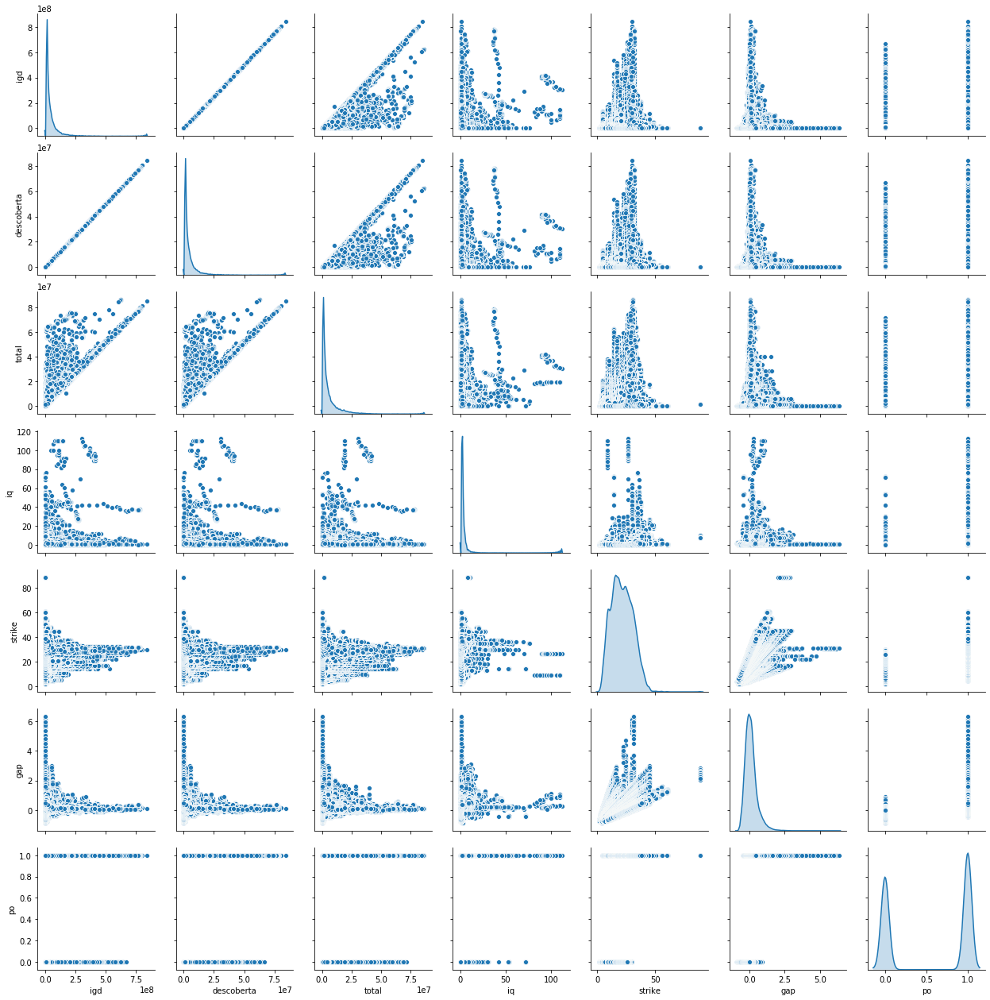

In [26]:
sns.pairplot(df_ready[['igd', 'descoberta','total', 'iq', 'strike', 'gap', 'po']], diag_kind="kde")
#Rápida análise exploratória dos principais features

In [27]:
from tensorflow import feature_column
from tensorflow.keras import layers

In [28]:
df_input=df_ready.copy()
#Dataframe que servirá para tratamento de features

In [29]:
df_input.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
close,116817.0,1.786423e+00,2.615657e+00,0.000000e+00,5.000000e-02,5.000000e-01,2.670000e+00,2.240000e+01
open,116817.0,1.800998e+00,2.617906e+00,0.000000e+00,5.000000e-02,5.200000e-01,2.690000e+00,2.240000e+01
min,116817.0,1.699382e+00,2.577677e+00,0.000000e+00,4.000000e-02,4.200000e-01,2.470000e+00,2.240000e+01
med,116817.0,1.789444e+00,2.616420e+00,1.000000e-02,4.000000e-02,5.100000e-01,2.670000e+00,2.240000e+01
max,116817.0,1.893036e+00,2.656171e+00,0.000000e+00,6.000000e-02,6.200000e-01,2.880000e+00,2.240000e+01
strike,157696.0,2.152837e+01,9.059873e+00,2.000000e+00,1.450000e+01,2.100000e+01,2.822000e+01,8.821000e+01
fech_adj,157696.0,2.015134e+01,7.066294e+00,4.200000e+00,1.470000e+01,2.159000e+01,2.659000e+01,3.112000e+01
volume,116817.0,9.740993e+05,3.003689e+06,1.000000e+00,6.630000e+03,7.756200e+04,5.546430e+05,8.406059e+07
coberta,157696.0,2.540659e+05,5.767759e+05,0.000000e+00,3.000000e+02,2.850000e+04,2.190250e+05,8.405600e+06
travada,157696.0,1.399269e+06,3.764488e+06,-7.646200e+06,0.000000e+00,9.520000e+04,9.242000e+05,6.149380e+07


In [30]:
df_input['gap_abs'] = df_input.apply(lambda x: abs (x['gap']), axis=1)

In [31]:
df_mask= df_input['gap_abs']<0.5
df_input=df_input[df_mask]
#Retira strikes muito longe do fechamento do dia

In [32]:
df_input['iq'] = df_input['iq'].clip(0.3,3)
#Clip de IQs de distorção

In [33]:
df_input['descpressure'] = df_ready['descpressure'].clip(0,50000000)
#Clip de pressão de distorção

In [34]:
df_mask= df_input['descoberta']>1000000
df_input=df_input[df_mask]
#Retirada de vendas descobertas abaixo de 1MM

In [35]:
df_input['descoberta'] = df_input['descoberta'].clip(0,25000000)
#Clip de vendas descobertas outliers

In [36]:
df_mask= df_input['strike']<40
df_input=df_input[df_mask]
#Retirada de strikes muito altos

In [37]:
df_input.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
close,45179.0,7.979026e-01,1.271901e+00,0.000000e+00,5.000000e-02,2.700000e-01,1.000000e+00,1.425000e+01
open,45179.0,8.112880e-01,1.273326e+00,0.000000e+00,6.000000e-02,2.900000e-01,1.020000e+00,1.425000e+01
min,45179.0,7.093982e-01,1.196534e+00,0.000000e+00,4.000000e-02,2.200000e-01,8.500000e-01,1.425000e+01
med,45179.0,7.996416e-01,1.271154e+00,1.000000e-02,5.000000e-02,2.700000e-01,1.000000e+00,1.425000e+01
max,45179.0,9.095354e-01,1.353836e+00,0.000000e+00,7.000000e-02,3.500000e-01,1.200000e+00,1.425000e+01
strike,48026.0,2.364178e+01,7.492005e+00,3.000000e+00,1.800000e+01,2.477000e+01,2.925000e+01,3.992000e+01
fech_adj,48026.0,2.165228e+01,6.376202e+00,4.200000e+00,1.673000e+01,2.305000e+01,2.685000e+01,3.112000e+01
volume,45179.0,2.171036e+06,4.497618e+06,1.000000e+00,5.612450e+04,5.161020e+05,2.152388e+06,8.406059e+07
coberta,48026.0,6.656208e+05,8.803640e+05,0.000000e+00,8.510000e+04,3.458000e+05,9.122075e+05,8.405600e+06
travada,48026.0,3.295375e+06,5.885948e+06,-7.646200e+06,0.000000e+00,7.886000e+05,3.912100e+06,6.149380e+07


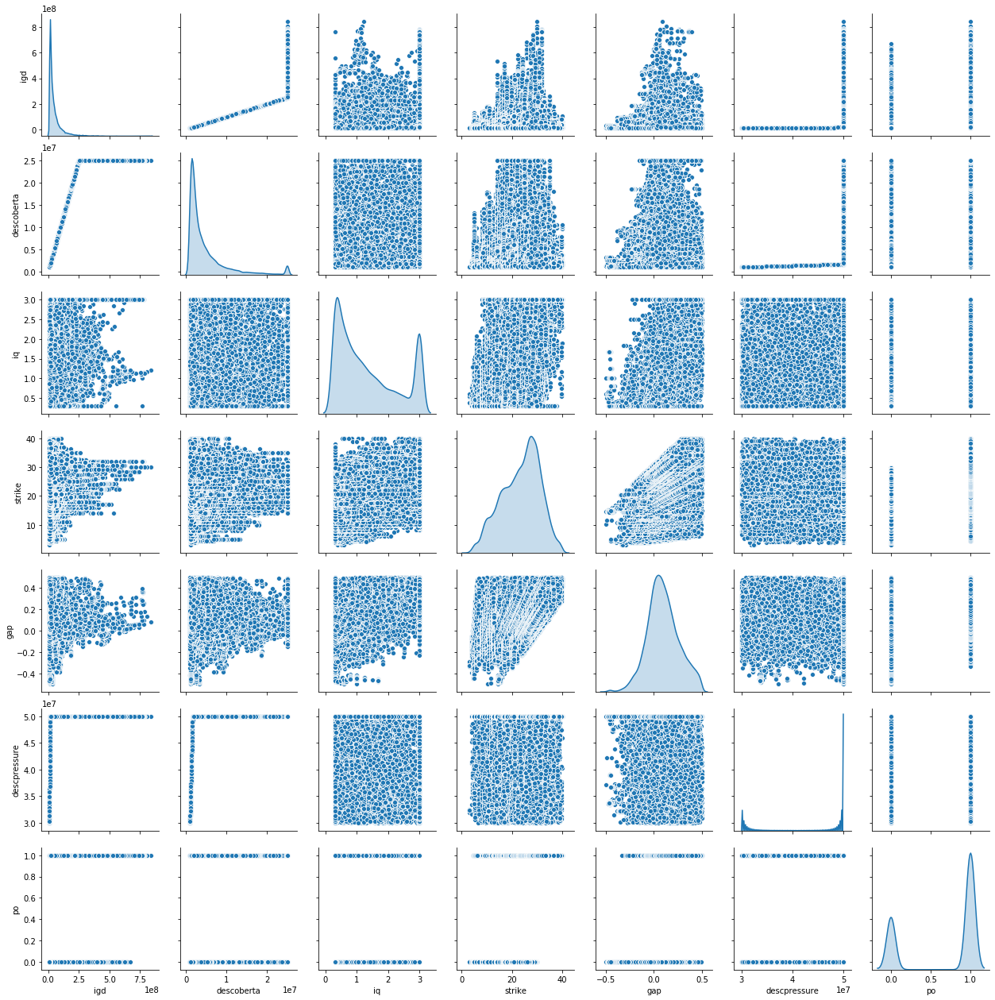

In [38]:
sns.pairplot(df_input[['igd', 'descoberta', 'iq', 'strike', 'gap', 'descpressure', 'po']], diag_kind="kde")
#Gráficos com melhor distribuição das principais features após pré-tratamento

In [39]:
carry_cols = ['data_venc','coberta', 'travada', 'descoberta', 'total', 
              'titulares', 'lancadores', 'iq', 'dte', 'gap','po']
#Colunas a serem utilizadas no modelo

In [41]:
dataset=df_input[carry_cols]
#Dataframe que servirá de input para modelos

In [42]:
drop_list=[
    #Outlier intra_venc variation,
    '20/04/2015', '18/01/2016', '21/03/2016', '18/06/2018', '16/03/2020', '20/04/2020','22/02/2021',
    #missing data,
    '15/05/2017', '19/06/2017',
    #ongoing months
    '20/08/2021', '17/09/2021']
#Vencimentos a serem desconsiderados

In [43]:
for drop_venc in drop_list:
    indexNames = dataset[(dataset['data_venc'] == drop_venc)].index
    dataset.drop(indexNames , inplace=True)

C:\conda\lib\site-packages\pandas\core\frame.py:4315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [44]:
non_normalizable = ['data_venc', 'po']
normalize_columns = list(set(carry_cols)-set(non_normalizable))
#Colunas que não devem ser normalizadas

In [45]:
from sklearn.preprocessing import StandardScaler
for col in normalize_columns:
    dataset[col]=StandardScaler().fit_transform(dataset[col].values.reshape(-1, 1))
#Normalização

C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

In [46]:
##Seleção de vencimentos para treinamento, teste e validação

In [47]:
import random
df_venc2 = dataset.data_venc
df_venc2 = df_venc2.drop_duplicates(keep='last')
df_venc2.columns = 'lista_venc'
lista_venc2 = list(df_venc2)
lista_venc_val=random.sample(lista_venc2, 13)
print (lista_venc_val)

['21/09/2020', '18/05/2015', '18/07/2016', '21/09/2015', '19/03/2018', '18/01/2021', '21/05/2018', '20/02/2017', '16/05/2016', '18/05/2020', '21/11/2017', '21/01/2019', '16/04/2018']


In [48]:
intermediate_dataset = dataset.copy()
for venc in lista_venc_val:
    indexintermediate = intermediate_dataset[(intermediate_dataset['data_venc'] == venc)].index
    intermediate_dataset.drop(indexintermediate, inplace=True)
val_dataset = dataset.drop(intermediate_dataset.index)

In [49]:
df_venc2 = intermediate_dataset.data_venc
df_venc2 = df_venc2.drop_duplicates(keep='last')
df_venc2.columns = 'lista_venc'
lista_venc2 = list(df_venc2)
lista_venc_test=random.sample(lista_venc2, 3)
print (lista_venc_test)

['19/10/2015', '16/01/2017', '19/12/2016']


In [50]:
train_dataset = intermediate_dataset.copy()
for venc in lista_venc_test:
    indextrain = train_dataset[(train_dataset['data_venc'] == venc)].index
    train_dataset.drop(indextrain, inplace=True)
test_dataset = intermediate_dataset.drop(train_dataset.index)

In [51]:
train_dataset.pop("data_venc")
test_dataset.pop('data_venc')
val_dataset.pop('data_venc')
#Retira data de vencimento

4256      18/05/2015
4259      18/05/2015
4263      18/05/2015
4265      18/05/2015
4268      18/05/2015
             ...    
136805    18/01/2021
136808    18/01/2021
136815    18/01/2021
136820    18/01/2021
136823    18/01/2021
Name: data_venc, Length: 7508, dtype: object

In [52]:
train_stats = train_dataset.describe().transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
coberta,35020.0,-0.021555,0.959948,-0.745941,-0.659875,-0.372648,0.271268,8.607962
travada,35020.0,0.033597,1.032860,-1.923217,-0.549322,-0.411496,0.154327,10.186329
descoberta,35020.0,0.002044,0.997214,-0.762523,-0.625366,-0.388124,0.195023,3.913425
total,35020.0,0.019838,1.017035,-0.864157,-0.653932,-0.335055,0.319214,8.362873
titulares,35020.0,0.002346,0.973183,-0.562501,-0.431976,-0.275346,0.064018,21.402186
lancadores,35020.0,0.012138,1.019828,-0.830451,-0.668279,-0.332350,0.359780,12.296849
iq,35020.0,0.034306,1.002347,-1.112382,-0.847724,-0.262517,0.850984,1.726344
dte,35020.0,-0.002315,0.994920,-1.724361,-0.843356,-0.122533,0.838565,2.280211
gap,35020.0,0.031162,0.986926,-3.634439,-0.618060,-0.045236,0.651461,2.490418
po,35020.0,0.693718,0.460955,0.000000,0.000000,1.000000,1.000000,1.000000


In [53]:
##Preparação do dataset

In [54]:
def df_to_dataset(dataframe, shuffle=True, batch_size=32):
  dataframe = dataframe.copy()
  labels = dataframe.pop('po')
  ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))
  if shuffle:
    ds = ds.shuffle(buffer_size=len(dataframe))
  ds = ds.batch(batch_size)
  return ds

In [55]:
batch_size = 32

final_train_data2 = df_to_dataset(train_dataset, batch_size=batch_size)
final_test_data2 = df_to_dataset(test_dataset, shuffle=False, batch_size=batch_size)
final_val_data2 = df_to_dataset(val_dataset, shuffle=False, batch_size=batch_size)


In [56]:
feature_columns = []

numeric_cols = list(train_dataset.columns)
numeric_cols.pop()
for header in numeric_cols:
  feature_columns.append(feature_column.numeric_column(header))


In [57]:
train_rfc=train_dataset.copy()
test_rfc=test_dataset.copy()

In [58]:
y_train = train_rfc.pop('po')
X_train = train_rfc.copy()
y_test = test_rfc.pop('po')
X_test = test_rfc.copy()

In [59]:
intermediate_dataset2=df_input.copy()
for venc in lista_venc_test:
    indexnaive = intermediate_dataset2[(intermediate_dataset2['data_venc'] == venc)].index
    intermediate_dataset2.drop(indexnaive, inplace=True)
naive_bench_dataset = df_input.drop(intermediate_dataset2.index)

In [60]:
##Definição de benchmark: A cada dia, strikes acima do vencimento serão preditos como executados (1)
##Strikes iguais ou abaixo do vencimento serão preditos como pó (0)

In [61]:
naive_bench_dataset['test_bench'] = naive_bench_dataset.apply(lambda x: 0 if x['gap']<=0 else 1, axis=1)

In [62]:
naive_prediction = naive_bench_dataset['test_bench']

In [63]:
from sklearn.metrics import accuracy_score
naive_score = round(accuracy_score(y_test, naive_prediction),3)
naive_score

0.881

In [64]:
##Random Forest

In [65]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators = 100, max_depth=50)

In [66]:
from sklearn.feature_selection import SelectFromModel
sel = SelectFromModel(rfc)
sel.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                 class_weight=None,
                                                 criterion='gini', max_depth=50,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,
                                                 random_state=None, verbose=0,
                                                 warm

In [67]:
sel.get_support()

array([False, False, False, False, False, False,  True, False,  True])

In [68]:
selected_feat= X_train.columns[(sel.get_support())]
print (selected_feat)

Index(['iq', 'gap'], dtype='object')


In [69]:
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=50, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [70]:
importances = rfc.feature_importances_

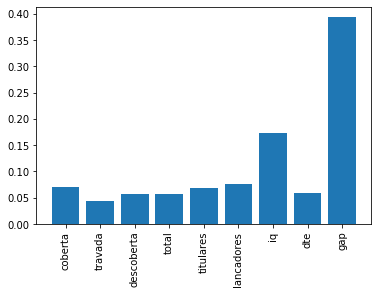

In [71]:
plt.bar(height=importances, x=X_train.columns)
plt.xticks(rotation='vertical')
plt.show()

In [72]:
rfc_test_prediction = rfc.predict(X_test)

In [73]:
from sklearn.metrics import accuracy_score
rfc_score = round(accuracy_score(y_test, rfc_test_prediction),3)
rfc_score

0.882

In [74]:
#Xgboost

In [75]:
from xgboost import XGBClassifier

In [76]:
modelo_xbg =  XGBClassifier(objective ='binary:logistic', 
                           n_estimators = 400, min_child_weight=5, max_depth=9, gamma=0.1, random_state=7, n_jobs=4)

modelo_xbg.fit(X_train, y_train)

C:\conda\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:56:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=9,
              min_child_weight=5, missing=nan, monotone_constraints='()',
              n_estimators=400, n_jobs=4, num_parallel_tree=1,
              objective='binary:logistic', random_state=7, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=True,
              validate_parameters=1, verbosity=None)

In [77]:
xgb_test_prediction = modelo_xbg.predict(X_test)

In [78]:
xgb_score = round(accuracy_score(y_test, xgb_test_prediction),3)
xgb_score

0.888

In [79]:
#Keras NN

In [80]:
feature_layer = tf.keras.layers.DenseFeatures(feature_columns)

In [81]:
metrics = [
      keras.metrics.Accuracy(name='accuracy'),
]


def build_model():
  model = keras.Sequential([
    feature_layer,
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    layers.Dense(1, activation='sigmoid')
  ])

 
  model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                optimizer='adam',
                metrics=['accuracy'])
  return model

In [82]:
model_n_sig=build_model()

In [83]:
# Mostra o progresso do treinamento imprimindo um único ponto para cada epoch completada
class PrintDot(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs):
    if epoch % 100 == 0: print('')
    print('.', end='')

EPOCHS = 1


model_n_sig.fit(final_train_data2, validation_data=final_val_data2, epochs=5)

Epoch 1/5
Consider rewriting this model with the Functional API.


C:\conda\lib\site-packages\tensorflow\python\keras\backend.py:5017: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'


Consider rewriting this model with the Functional API.
1086/1095 [============================>.] - ETA: 0s - loss: 0.3070 - accuracy: 0.8574WARNING:tensorflow:Layers in a Sequential model should only have a single input tensor, but we receive a <class 'dict'> input: {'coberta': <tf.Tensor 'ExpandDims:0' shape=(None, 1) dtype=float64>, 'travada': <tf.Tensor 'ExpandDims_8:0' shape=(None, 1) dtype=float64>, 'descoberta': <tf.Tensor 'ExpandDims_1:0' shape=(None, 1) dtype=float64>, 'total': <tf.Tensor 'ExpandDims_7:0' shape=(None, 1) dtype=float64>, 'titulares': <tf.Tensor 'ExpandDims_6:0' shape=(None, 1) dtype=float64>, 'lancadores': <tf.Tensor 'ExpandDims_5:0' shape=(None, 1) dtype=float64>, 'iq': <tf.Tensor 'ExpandDims_4:0' shape=(None, 1) dtype=float64>, 'dte': <tf.Tensor 'ExpandDims_2:0' shape=(None, 1) dtype=float64>, 'gap': <tf.Tensor 'ExpandDims_3:0' shape=(None, 1) dtype=float64>}
Consider rewriting this model with the Functional API.
1095/1095 [==============================] - 4

In [84]:
loss, accuracy = model_n_sig.evaluate(final_test_data2)
print("Accuracy", accuracy)

19/19 [==============================] - 0s 1ms/step - loss: 0.2374 - accuracy: 0.8790
Accuracy 0.8790460228919983


In [85]:
keras_score=round(accuracy,3)
keras_score

0.879

In [86]:
#Comparando os scores RAW

In [87]:
(naive_score, rfc_score, xgb_score, keras_score)

(0.881, 0.882, 0.888, 0.879)

In [88]:
#Entendendo como funciona a predição da NN

In [89]:
keras_raw=model_n_sig.predict(final_test_data2)

Consider rewriting this model with the Functional API.


In [90]:
type(keras_raw)

numpy.ndarray

In [91]:
keras_raw_bin = [(0 if x<=0.5 else 1) for x in keras_raw]

In [92]:
accuracy_score(y_test, keras_raw_bin)

0.879045996592845

In [93]:
##FAZ PREDIÇÃO COM MODELO TREINADO SOBRE TODOS OS DADOS

In [94]:
dataforward_recent=df_ready[carry_cols]

In [95]:
dataforward_recent.pop("data_venc")

0         19/01/2015
1         19/01/2015
2         19/01/2015
3         19/01/2015
4         19/01/2015
             ...    
157691    17/09/2021
157692    17/09/2021
157693    17/09/2021
157694    17/09/2021
157695    17/09/2021
Name: data_venc, Length: 157696, dtype: object

In [96]:
from sklearn.preprocessing import StandardScaler
for col in normalize_columns:
    dataforward_recent[col]=StandardScaler().fit_transform(dataforward_recent[col].values.reshape(-1, 1))

C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

In [97]:
forward_data_recent = df_to_dataset(dataforward_recent, shuffle=False)

In [98]:
forward_sig_predictions_recent = model_n_sig.predict(forward_data_recent)

In [99]:
df_input4=df_ready.copy()

In [100]:
##Juntando as predições ao dataframe original

In [101]:
df_input4['prediction']=forward_sig_predictions_recent

In [102]:
df_input4['prediction_updt'] = df_input4.apply(lambda x: 0 if x['prediction']<=0.5 else 1, axis=1)
#Fazendo predição binária sobre probabilidades

In [103]:
df_input4['prediction_updt'].describe()

count    157696.000000
mean          0.656313
std           0.474940
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: prediction_updt, dtype: float64

In [104]:
df_input4 = df_input4.sort_values(by=['strike'], ignore_index = False)
df_input4['prediction_updt_cumm'] = df_input4.groupby(by=['date_venc', 'date'])['prediction_updt'].transform('cumsum')
#Calcula predições cumulativas, devido à natureza do problema

In [105]:
df_input4 = df_input4.sort_values(by=['date_venc', 'date', 'strike'], ignore_index=False)

In [106]:
df_input4['bench'] = df_input4.apply(lambda x: 0 if x['gap']<=0 else 1, axis=1)

In [107]:
stat = df_input4.groupby(by=['dtebinned'])['prediction_updt_cumm'].describe().transpose()
stat

dtebinned,under_5,10_to_5,15_to_10,20_to_15,25_to_20,30_to_25,30+
count,15183.000000,14736.000000,20259.000000,19193.000000,15578.000000,14449.000000,58298.000000
mean,20.106369,17.924267,17.509058,17.475851,17.092374,16.373590,14.323819
std,20.975224,19.753616,19.445222,19.307627,19.530567,18.808617,16.177349
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,15.000000,12.000000,12.000000,12.000000,11.000000,10.000000,9.000000
75%,32.000000,30.000000,29.000000,29.000000,29.000000,27.000000,25.000000
max,109.000000,99.000000,98.000000,103.000000,107.000000,109.000000,109.000000


In [108]:
df_input4['binary_prediction'] = df_input4.apply(lambda x: 
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['30+']) & (x['dtebinned']=='30+') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['30_to_25']) & (x['dtebinned']=='30_to_25') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['25_to_20']) & (x['dtebinned']=='25_to_20') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['20_to_15']) & (x['dtebinned']=='20_to_15') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['15_to_10']) & (x['dtebinned']=='15_to_10') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['10_to_5']) & (x['dtebinned']=='10_to_5') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['under_5']) & (x['dtebinned']=='under_5') else
                                                 1, axis=1)
#Utilizando a mediana das predições cumulativas em cada bin de datas, recria a predição primária

In [109]:
##score global

In [110]:
from sklearn.metrics import accuracy_score

In [111]:
accuracy_score(df_input4['po'], df_input4['bench'])

0.9126420454545454

In [112]:
accuracy_score(df_input4['po'], df_input4['binary_prediction'])

0.884569044237013

In [113]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(df_input4['po'], df_input4['binary_prediction']).ravel()
(tn, fp, fn, tp)

(65995, 3828, 14375, 73498)

In [114]:
df_mask= (df_input4['gap']<=0.05) & (df_input4['gap']>=-0.05) & (df_input4['dtebinned']=='30_to_25')
df_eval_atm=df_input4[df_mask]

In [115]:
accuracy_score(df_eval_atm['po'], df_eval_atm['bench'])

0.6065989847715736

In [116]:
accuracy_score(df_eval_atm['po'], df_eval_atm['binary_prediction'])

0.6459390862944162

In [117]:
##Score Validação

In [118]:
df_mask= df_input4['data_venc'].isin(lista_venc_val)
df_eval_val=df_input4[df_mask]

In [119]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_val['po'], df_eval_val['bench'])

0.9317568888020324

In [120]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_val['po'], df_eval_val['binary_prediction'])

0.8977135040062537

In [121]:
df_mask= (df_input4['gap']<=0.03) & (df_input4['gap']>=-0.03) & (df_input4['dtebinned']=='30_to_25') & (df_input4['data_venc'].isin(lista_venc_val))
df_eval_atm=df_input4[df_mask]

In [122]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm['po'], df_eval_atm['bench'])

0.5611510791366906

In [123]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm['po'], df_eval_atm['binary_prediction'])

0.5827338129496403

In [124]:
##Score Teste

In [125]:
lista_venc_test

['19/10/2015', '16/01/2017', '19/12/2016']

In [126]:
df_mask= df_input4['data_venc'].isin(lista_venc_test)
df_eval_test=df_input4[df_mask]

In [127]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_test['po'], df_eval_test['bench'])

0.9534342258440046

In [128]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_test['po'], df_eval_test['binary_prediction'])

0.8047147846332945

In [129]:
df_mask= (df_input4['gap']<=0.05) & (df_input4['gap']>=-0.05) & (df_input4['dtebinned']=='20_to_15') & (df_input4['data_venc'].isin(lista_venc_test))
df_eval_atm_test=df_input4[df_mask]

In [130]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm_test['po'], df_eval_atm_test['bench'])

0.4857142857142857

In [131]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm_test['po'], df_eval_atm_test['binary_prediction'])

0.7714285714285715

In [132]:
##Avaliação sobre o próximo vencimento

In [133]:
df_mask= df_input4['data_venc']=='17/09/2021'
df_print=df_input4[df_mask]

In [134]:
z = df_print['prediction_updt_cumm'].max()
z

49

In [135]:
fig = px.scatter(df_print, x='strike', y='prediction_updt_cumm', animation_frame='dte', range_x = [20,34], range_y=[-10,z],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores'])
fig.show()

In [136]:
z = df_print['prediction_updt'].max()
z

1

In [137]:
fig = px.scatter(df_print, x='strike', y='prediction_updt', animation_frame='dte', range_y=[-1,z+1], range_x = [20,34],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores', 'po'])
fig.show()

In [138]:
fig = px.scatter(df_print, x='strike', y='prediction', animation_frame='dte', range_x = [20,34],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores', 'po'])
fig.show()

In [139]:
#keras non sigmoidal output

In [140]:
feature_layer = tf.keras.layers.DenseFeatures(feature_columns)

In [141]:
metrics = [
      #keras.metrics.TruePositives(name='tp'),
      #keras.metrics.FalsePositives(name='fp'),
      #keras.metrics.TrueNegatives(name='tn'),
      #keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.Accuracy(name='accuracy'),
      #keras.metrics.Precision(name='precision'),
      #keras.metrics.Recall(name='recall'),
      #keras.metrics.AUC(name='auc'),
      #keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]


def build_model():
  model = keras.Sequential([
    feature_layer,
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    layers.Dense(68, activation='swish'),
    layers.Dense(68, activation='relu'),
    #layers.Dropout(.1),
    layers.Dense(1)
  ])

 
  model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                optimizer='adam',
                metrics=['accuracy'])
  return model

In [142]:
model_n=build_model()

In [143]:
# Mostra o progresso do treinamento imprimindo um único ponto para cada epoch completada
class PrintDot(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs):
    if epoch % 100 == 0: print('')
    print('.', end='')

EPOCHS = 1


model_n.fit(final_train_data2, validation_data=final_val_data2, epochs=2)

Epoch 1/2
Consider rewriting this model with the Functional API.
Consider rewriting this model with the Functional API.
1091/1095 [============================>.] - ETA: 0s - loss: 0.3039 - accuracy: 0.8493WARNING:tensorflow:Layers in a Sequential model should only have a single input tensor, but we receive a <class 'dict'> input: {'coberta': <tf.Tensor 'ExpandDims:0' shape=(None, 1) dtype=float64>, 'travada': <tf.Tensor 'ExpandDims_8:0' shape=(None, 1) dtype=float64>, 'descoberta': <tf.Tensor 'ExpandDims_1:0' shape=(None, 1) dtype=float64>, 'total': <tf.Tensor 'ExpandDims_7:0' shape=(None, 1) dtype=float64>, 'titulares': <tf.Tensor 'ExpandDims_6:0' shape=(None, 1) dtype=float64>, 'lancadores': <tf.Tensor 'ExpandDims_5:0' shape=(None, 1) dtype=float64>, 'iq': <tf.Tensor 'ExpandDims_4:0' shape=(None, 1) dtype=float64>, 'dte': <tf.Tensor 'ExpandDims_2:0' shape=(None, 1) dtype=float64>, 'gap': <tf.Tensor 'ExpandDims_3:0' shape=(None, 1) dtype=float64>}
Consider rewriting this model with t

In [144]:
loss, accuracy = model_n.evaluate(final_test_data2)
print("Accuracy", accuracy)

19/19 [==============================] - 0s 2ms/step - loss: 0.2570 - accuracy: 0.8603
Accuracy 0.8603066205978394


In [145]:
keras_raw=model_n.predict(final_test_data2)

Consider rewriting this model with the Functional API.


In [146]:
keras_raw

array([[ 1.35959148e+00],
       [ 1.71391141e+00],
       [ 4.76085043e+00],
       [ 1.07949364e+00],
       [ 1.80823386e+00],
       [ 4.38306093e+00],
       [ 1.27946392e-01],
       [ 1.08486068e+00],
       [ 2.18454766e+00],
       [ 4.46207523e+00],
       [ 6.97816253e-01],
       [ 1.47108305e+00],
       [ 2.63056898e+00],
       [ 5.20318794e+00],
       [ 4.05815333e-01],
       [ 1.46241117e+00],
       [ 2.79258060e+00],
       [ 5.31601906e+00],
       [ 9.63118076e-01],
       [ 2.12356901e+00],
       [ 3.26740408e+00],
       [ 6.19357157e+00],
       [ 2.93243837e+00],
       [ 4.12577772e+00],
       [ 3.69144726e+00],
       [ 5.11675692e+00],
       [ 4.52846527e+00],
       [ 2.63188219e+00],
       [ 5.25207615e+00],
       [ 5.01492500e+00],
       [ 3.92152691e+00],
       [ 5.40290642e+00],
       [ 3.24432802e+00],
       [ 1.39633381e+00],
       [ 3.39052916e+00],
       [ 6.67113304e+00],
       [ 3.62697840e+00],
       [ 1.65785468e+00],
       [ 4.5

In [147]:
##FAZ PREDIÇÃO COM MODELO TREINADO

In [148]:
dataforward_recent=df_ready[carry_cols]

In [149]:
dataforward_recent.pop("data_venc")

0         19/01/2015
1         19/01/2015
2         19/01/2015
3         19/01/2015
4         19/01/2015
             ...    
157691    17/09/2021
157692    17/09/2021
157693    17/09/2021
157694    17/09/2021
157695    17/09/2021
Name: data_venc, Length: 157696, dtype: object

In [150]:
from sklearn.preprocessing import StandardScaler
for col in normalize_columns:
    dataforward_recent[col]=StandardScaler().fit_transform(dataforward_recent[col].values.reshape(-1, 1))

C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\conda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#return

In [151]:
forward_data_recent = df_to_dataset(dataforward_recent, shuffle=False)

In [152]:
forward_predictions_recent = model_n.predict(forward_data_recent)

In [153]:
df_input3=df_ready.copy()

In [154]:
df_input3['prediction']=forward_predictions_recent

In [155]:
df_input3['prediction_updt'] = df_input3.apply(lambda x: 0 if x['prediction']<=0 else x['prediction'], axis=1)

In [156]:
print (lista_venc)

['19/01/2015', '09/02/2015', '16/03/2015', '20/04/2015', '18/05/2015', '15/06/2015', '20/07/2015', '17/08/2015', '21/09/2015', '19/10/2015', '16/11/2015', '21/12/2015', '18/01/2016', '15/02/2016', '21/03/2016', '18/04/2016', '16/05/2016', '20/06/2016', '18/07/2016', '15/08/2016', '19/09/2016', '17/10/2016', '21/11/2016', '19/12/2016', '16/01/2017', '20/02/2017', '20/03/2017', '17/04/2017', '15/05/2017', '19/06/2017', '17/07/2017', '21/08/2017', '18/09/2017', '16/10/2017', '21/11/2017', '18/12/2017', '15/01/2018', '19/02/2018', '19/03/2018', '16/04/2018', '21/05/2018', '18/06/2018', '16/07/2018', '20/08/2018', '17/09/2018', '15/10/2018', '19/11/2018', '17/12/2018', '21/01/2019', '18/02/2019', '18/03/2019', '15/04/2019', '20/05/2019', '17/06/2019', '15/07/2019', '19/08/2019', '16/09/2019', '21/10/2019', '18/11/2019', '16/12/2019', '20/1/2020', '17/2/2020', '16/03/2020', '20/04/2020', '18/05/2020', '15/06/2020', '20/07/2020', '17/08/2020', '21/09/2020', '19/10/2020', '16/11/2020', '21/12/

In [157]:
df_input3['prediction_updt'].describe()

count    157696.000000
mean          2.661521
std           3.354717
min           0.000000
25%           0.000000
50%           1.598921
75%           4.334722
max          50.771267
Name: prediction_updt, dtype: float64

In [158]:
df_input3 = df_input3.sort_values(by=['strike'], ignore_index = False)
df_input3['prediction_updt_cumm'] = df_input3.groupby(by=['date_venc', 'date'])['prediction_updt'].transform('cumsum')

In [159]:
df_input3 = df_input3.sort_values(by=['date_venc', 'date', 'strike'], ignore_index=False)

In [160]:
df_input3['prob'] = df_input3.apply(lambda x: tf.nn.sigmoid(x['prediction_updt_cumm']), axis=1)

In [161]:
df_input3['prob2'] = df_input3.apply(lambda x: x['prob'].numpy(), axis=1)

In [162]:
df_input3['bench'] = df_input3.apply(lambda x: 0 if x['gap']<=0 else 1, axis=1)

In [163]:
stat = df_input3.groupby(by=['dtebinned'])['prediction_updt_cumm'].describe().transpose()
stat

dtebinned,under_5,10_to_5,15_to_10,20_to_15,25_to_20,30_to_25,30+
count,15183.000000,14736.000000,20259.000000,19193.000000,15578.000000,14449.000000,58298.000000
mean,104.567695,80.468847,67.051445,53.613503,46.199466,40.408732,27.191014
std,154.213453,122.643386,104.542568,89.333430,83.935244,78.975940,52.603849
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.294747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,41.728372,24.797973,17.639437,12.305601,9.323857,7.672081,5.405406
75%,150.709124,118.419049,99.080567,77.341774,62.612804,52.036025,35.867325
max,1369.517922,900.667010,777.091685,839.185739,888.054250,1010.619418,902.424653


In [164]:
df_input3['binary_prediction'] = df_input3.apply(lambda x: 
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['30+']) & (x['dtebinned']=='30+') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['30_to_25']) & (x['dtebinned']=='30_to_25') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['25_to_20']) & (x['dtebinned']=='25_to_20') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['20_to_15']) & (x['dtebinned']=='20_to_15') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['15_to_10']) & (x['dtebinned']=='15_to_10') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['10_to_5']) & (x['dtebinned']=='10_to_5') else
                                                 0 if (x['prediction_updt_cumm']<=stat.iloc[5]['under_5']) & (x['dtebinned']=='under_5') else
                                                 1, axis=1)

In [165]:
##score global

In [166]:
from sklearn.metrics import accuracy_score

In [167]:
accuracy_score(df_input3['po'], df_input3['bench'])

0.9126420454545454

In [168]:
accuracy_score(df_input3['po'], df_input3['binary_prediction'])

0.8939541903409091

In [169]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(df_input3['po'], df_input3['binary_prediction']).ravel()
(tn, fp, fn, tp)

(65975, 3848, 12875, 74998)

In [170]:
df_mask= (df_input3['gap']<=0.05) & (df_input3['gap']>=-0.05) & (df_input3['dtebinned']=='30_to_25')
df_eval_atm=df_input3[df_mask]

In [171]:
accuracy_score(df_eval_atm['po'], df_eval_atm['bench'])

0.6065989847715736

In [172]:
accuracy_score(df_eval_atm['po'], df_eval_atm['binary_prediction'])

0.6059644670050761

In [173]:
##Score Validação

In [174]:
df_mask= df_input3['data_venc'].isin(lista_venc_val)
df_eval_val=df_input3[df_mask]

In [175]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_val['po'], df_eval_val['bench'])

0.9317568888020324

In [176]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_val['po'], df_eval_val['binary_prediction'])

0.9073675982020716

In [177]:
df_mask= (df_input3['gap']<=0.03) & (df_input3['gap']>=-0.03) & (df_input3['dtebinned']=='30_to_25') & (df_input3['data_venc'].isin(lista_venc_val))
df_eval_atm=df_input3[df_mask]

In [178]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm['po'], df_eval_atm['bench'])

0.5611510791366906

In [179]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm['po'], df_eval_atm['binary_prediction'])

0.5611510791366906

In [180]:
##Score Teste

In [181]:
lista_venc_test

['19/10/2015', '16/01/2017', '19/12/2016']

In [182]:
df_mask= df_input3['data_venc'].isin(lista_venc_test)
df_eval_test=df_input3[df_mask]

In [183]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_test['po'], df_eval_test['bench'])

0.9534342258440046

In [184]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_test['po'], df_eval_test['binary_prediction'])

0.8949359720605355

In [185]:
z=set(df_input3.dtebinned)
z

{'10_to_5', '15_to_10', '20_to_15', '25_to_20', '30+', '30_to_25', 'under_5'}

In [186]:
df_mask= (df_input3['gap']<=0.05) & (df_input3['gap']>=-0.05) & (df_input3['dtebinned']=='20_to_15') & (df_input3['data_venc'].isin(lista_venc_test))
df_eval_atm_test=df_input3[df_mask]

In [187]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm_test['po'], df_eval_atm_test['bench'])

0.4857142857142857

In [188]:
from sklearn.metrics import accuracy_score
accuracy_score(df_eval_atm_test['po'], df_eval_atm_test['binary_prediction'])

0.7714285714285715

In [189]:
##Avaliação sobre o vencimento atual

In [190]:
df_mask= df_input3['data_venc']=='17/09/2021'
df_print=df_input3[df_mask]

In [191]:
z = df_print['prediction_updt_cumm'].max()
z

181.9447504580021

In [192]:
fig = px.scatter(df_print, x='strike', y='prediction_updt_cumm', animation_frame='dte', range_x = [20,34], range_y=[-10,z],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores'])
fig.show()

In [193]:
z = df_print['prediction_updt'].max()
z

12.29023265838623

In [194]:
fig = px.scatter(df_print, x='strike', y='prediction_updt', animation_frame='dte', range_y=[-10,z], range_x = [20,34],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores', 'po'])
fig.show()

In [195]:
fig = px.scatter(df_print, x='strike', y='binary_prediction', animation_frame='dte', range_x = [20,34],
                hover_data = ['ticker', 'cotexec', 'fech_adj', 'iq', 'descoberta', 'data', 'titulares', 'lancadores', 'po'])
fig.show()

In [196]:
PLOTAR CURVAS AUC E ROC

SyntaxError: invalid syntax (<ipython-input-196-b598058330a5>, line 1)

In [ ]:
TT

In [ ]:
##classificador1 - ok - com preço e gap abs
##classificador3 - ok - com preço e gap abs
##classificador5_sem_preco - OK - com gap abs
##classificador8_sem_preco - OK - sem gap abs
##classificador9_sem_preco_sem_gap - sem preço e sem gap
##classificador11_sem_preco_com_gap - OK - ULTIMO NIVEL
##classificador15_sem_preco_com_gap'


##model_n.save('classificador15_sem_preco_com_gap')